<a href="https://colab.research.google.com/github/lijsamuael/End-to-end-dog-breed-classfication-machine-learning-project/blob/main/dog_breed_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [50]:
#!unzip "drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/"

In [63]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub 
import numpy as np
import matplotlib.pyplot as plt
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available " if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.8.2
TF Hub version: 0.12.0
GPU not available :(


In [64]:
#imporint the labels of our dataset
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/labels.csv")
labels_csv.head(10)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
5,002211c81b498ef88e1b40b9abf84e1d,bedlington_terrier
6,00290d3e1fdd27226ba27a8ce248ce85,bedlington_terrier
7,002a283a315af96eaea0e28e7163b21b,borzoi
8,003df8b8a8b05244b1d920bb6cf451f9,basenji
9,0042188c895a2f14ef64a918ed9c7b64,scottish_deerhound


In [65]:
#checking for the shape of the dataset to ensure we have no error in importing the dataset
labels_csv.shape

(10222, 2)

In [66]:
#imges in each dog bread
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

In [67]:
#doing the same thing like the above
labels_csv.groupby("breed").count()

,id
breed,
affenpinscher,80
afghan_hound,116
african_hunting_dog,86
airedale,107
american_staffordshire_terrier,74
...,...
welsh_springer_spaniel,79
west_highland_white_terrier,81
whippet,95


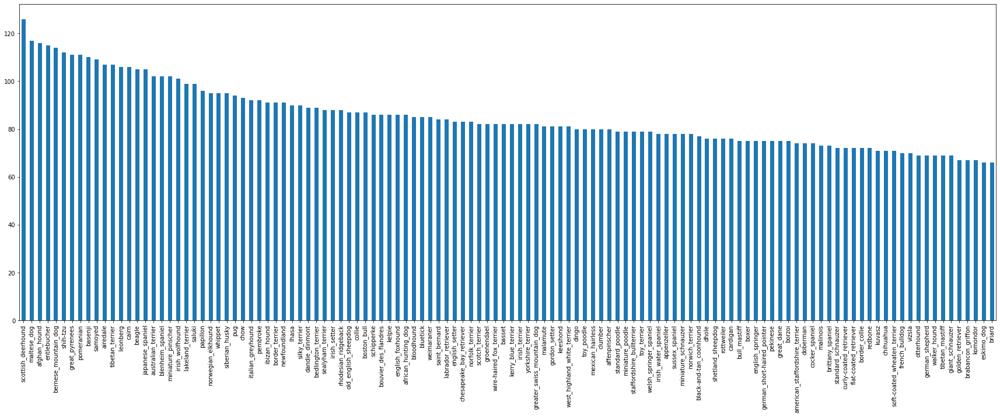

In [42]:
#ploting the number of images in each dog breed
labels_csv["breed"].value_counts().plot(kind="bar", figsize=(30,10));

#Ways of Viewing an image 
  * Using IPython
  * Using Opencv_python
  * Using TensorFlow Keras




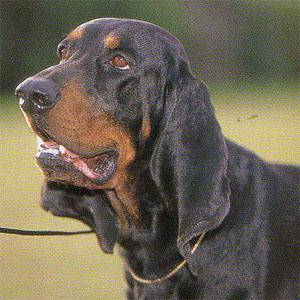

In [68]:
#first way to view and image using Ipython
from IPython.display import Image
Image("/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/test/0a0b97441050bba8e733506de4655ea1.jpg", width=224, height=224)

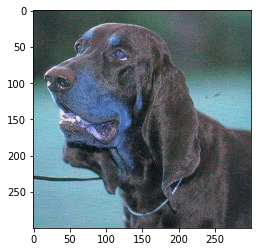

In [58]:
#second way using cv2
import matplotlib.pyplot as plt
import cv2
img2 = cv2.imread("/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/test/0a0b97441050bba8e733506de4655ea1.jpg")
plt.imshow(img2)

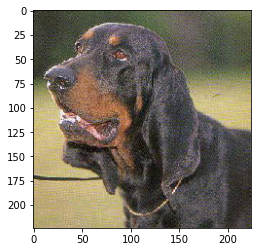

In [69]:
#Third way form tensorflow
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
img = image.load_img("/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/test/0a0b97441050bba8e733506de4655ea1.jpg", target_size=(224,224))
plt.imshow(img);

#Getting training images filepaths

In [70]:
filenames = ["/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/train/" + i + ".jpg" for i in labels_csv["id"]]
filenames[:10]

['/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 

In [61]:
#checking the number of the imagefile names 
len(filenames)

10222

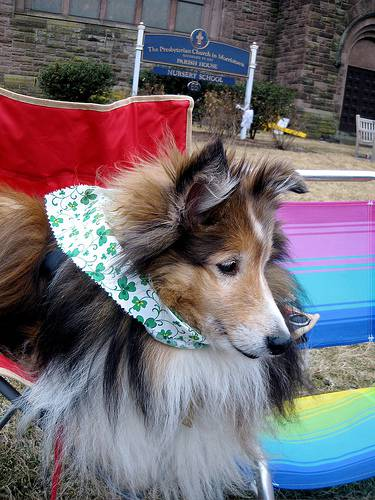

In [62]:
#ckecking if we made it correctly
Image(filenames[10])

In [71]:
#extracting lables form the csv files
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels, len(labels)

(array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
        'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object),
 10222)

In [72]:
#makinga a unique array form the names of the dog breeds
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [65]:
#printing the numbers of dog breeds
len(unique_breeds)

120

In [73]:
#Making boolean dog breed labels
boolean_labels = [breeds == unique_breeds for breeds in labels]
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

#Making train validation set split

In [74]:
#making the labels and the features
X = filenames
Y = boolean_labels

In [76]:
#setting up the image number diciding slider
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [77]:
#making train validation set split
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, Y_train, Y_val = train_test_split(X[:NUM_IMAGES], Y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(X_train), len(Y_train), len(X_val), len(Y_val)

(800, 800, 200, 200)

#Working with images

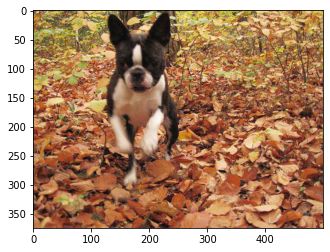

In [79]:
#convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[0])
plt.imshow(image);

In [80]:
#viewing an imported image
image.shape

(375, 500, 3)

In [81]:
type(image), image.dtype

(numpy.ndarray, dtype('uint8'))

In [82]:
#Converting to tensorflow object
import tensorflow as tf
imageTf = tf.constant(image),
imageTf

(<tf.Tensor: shape=(375, 500, 3), dtype=uint8, numpy=
 array([[[109,  46,   0],
         [153,  91,  40],
         [180, 120,  68],
         ...,
         [176, 144,  71],
         [189, 157,  84],
         [214, 182, 109]],
 
        [[153,  92,  47],
         [179, 121,  75],
         [167, 111,  64],
         ...,
         [167, 135,  58],
         [171, 139,  62],
         [188, 156,  79]],
 
        [[152,  97,  56],
         [189, 136,  94],
         [164, 113,  70],
         ...,
         [200, 168,  81],
         [194, 162,  75],
         [200, 168,  81]],
 
        ...,
 
        [[189, 122,  69],
         [186, 119,  66],
         [183, 116,  63],
         ...,
         [213, 160, 108],
         [212, 159, 107],
         [209, 156, 104]],
 
        [[186, 119,  66],
         [184, 117,  64],
         [183, 116,  63],
         ...,
         [197, 145,  88],
         [199, 147,  90],
         [199, 147,  90]],
 
        [[182, 115,  62],
         [181, 114,  61],
         [183,

#Load the Images
We shall now define the function load_img as follows:



1.   Define the image size

2.   use **tf.image.decode_image.** and this will detects whether an image is a BMP, GIF, JPEG, or PNG, and performs the appropriate operation to convert the input bytes string into a Tensor of type uint8. For uint8, the minimum value is 0 and the maximum value is 255.
3.   Convert the image pixels to float32 using **tf.image.convert_image_dtype.**
4.   Get the maximum dimension long_dim from the shape of the input image.  The max_dim is divided by this long_dim to get the scale measure so that the scale could be used to resize the image.
5.   The shape is multiplied by scale and the integer result is used along with **tf.image.resize to resize the image.**








##Now letme implement these steps with the code.


In [83]:
#A function that converts the whole images to tensorflow

IMAGE_SIZE = 224
def process_image(image_path, img_size=IMAGE_SIZE):
  image = tf.io.read_file(image_path)                         # Reads the contents of file
  image = tf.image.decode_jpeg(image, channels=3)            # convert the input bytes string into a Tensor of type uint8
  image = tf.image.convert_image_dtype(image, tf.float32)     # Change the values from 0-255 to 0-1 values
  image = tf.image.resize(image, size=[img_size, img_size])   # Resize the image

  return image

In [84]:
#a function that retrurns a tuple of image and their labels
def get_image_label(image_path, label):
  image = process_image(image_path)

  return image, label


In [85]:
#letme implement the above two functions and see the effect
get_image_label(filenames[0], boolean_labels[0])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.5705322 , 0.33588538, 0.15008473],
         [0.66901225, 0.4601166 , 0.26022965],
         [0.61062384, 0.43763596, 0.21601713],
         ...,
         [0.8182312 , 0.7297958 , 0.26963907],
         [0.72454786, 0.6059109 , 0.2653059 ],
         [0.7494603 , 0.6252918 , 0.32456532]],
 
        [[0.6761415 , 0.4733761 , 0.30642927],
         [0.5672121 , 0.38192675, 0.20349538],
         [0.5883547 , 0.4322571 , 0.2403155 ],
         ...,
         [0.9326942 , 0.8260503 , 0.41093278],
         [0.86072475, 0.74250627, 0.3694122 ],
         [0.76781666, 0.6461604 , 0.29291284]],
 
        [[0.46350825, 0.29595745, 0.1536156 ],
         [0.42554107, 0.27039403, 0.12009468],
         [0.7887875 , 0.6547362 , 0.49015   ],
         ...,
         [0.89372385, 0.7696401 , 0.41811958],
         [0.88609535, 0.7585918 , 0.36495727],
         [0.8243601 , 0.69494826, 0.2930575 ]],
 
        ...,
 
        [[0.7344025 , 0.4716574 

#Turning our data into batches
**Batch size is the number of samples taht will be passed through to the model at one time. Or the number of training examples utilized in one iteration.**

###Code example
*   dataset = tf.data.Dataset.range(8)
*   dataset = dataset.batch(3)
*   list(dataset.as_numpy_iterator())
###Output
###[array([0, 1, 2]), array([3, 4, 5]), array([6, 7]),]


##To make or batch first we should create a input pipline


*   Construct a Dataset from data in memory, you can use **tf.data.Dataset.from_tensors()** or **tf.data.Dataset.from_tensor_slices().**

*   Once you have a Dataset object, you can transform it into a new Dataset by chaining method calls on the **tf.data.Dataset** object. For example, you can apply per-element transformations such as **Dataset.map**, and multi-element transformations such as **Dataset.batch.** 



In [86]:
#Creating a function that convertes image datas into batches

BATCH_SIZE = 32
def create_data_batches(X, Y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):

  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  tf.constant(Y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  tf.constant(Y)))
    data = data.shuffle(buffer_size=len(X))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
  return data_batch
  



In [87]:
# Check the above function and Create training and validation data batches

train_data = create_data_batches(X_train, Y_train)
val_data = create_data_batches(X_val, Y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [79]:
train_data.take(1)

<TakeDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  


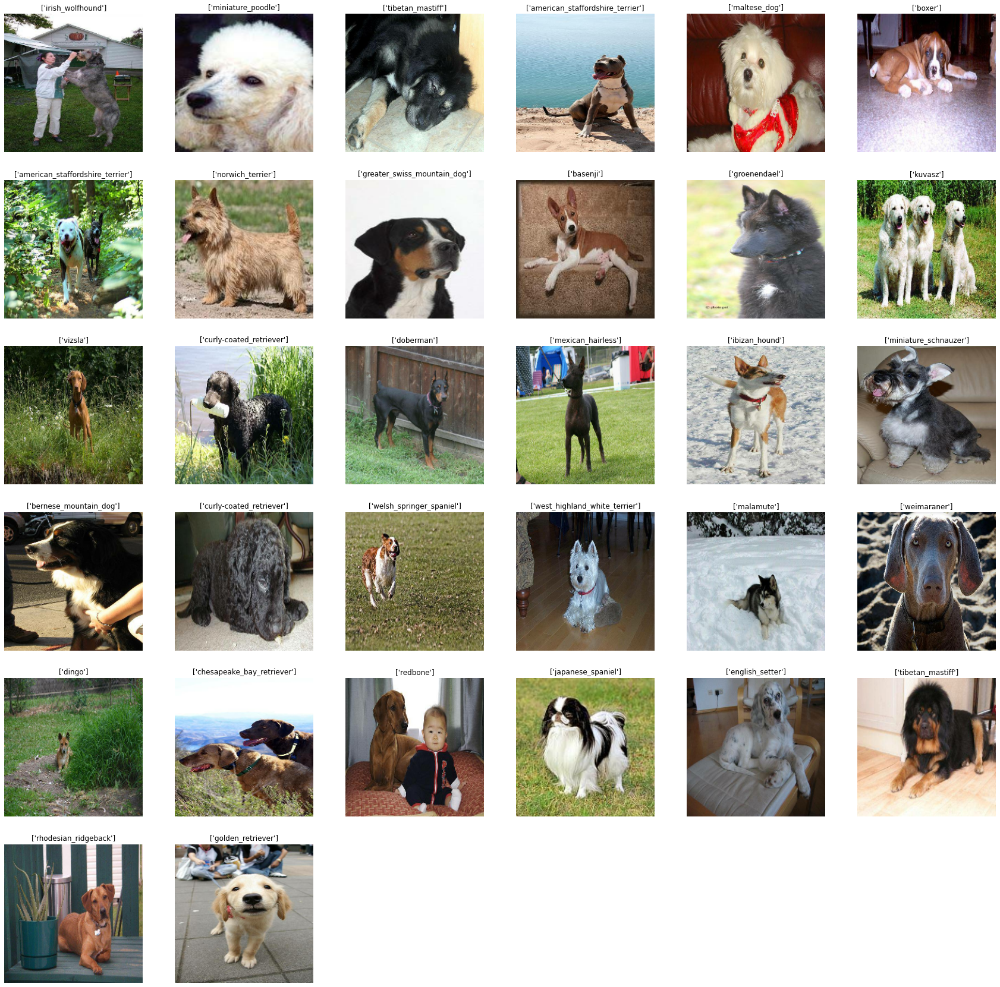

In [80]:
#viewing images in the data batch

plt.figure(figsize=(30, 30))
for images, labels in train_data.as_numpy_iterator():
  for i in range(32):
    ax = plt.subplot(6, 6, i + 1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i]])
    plt.axis("off")

#Model Building


(-0.5, 846.5, 329.5, -0.5)

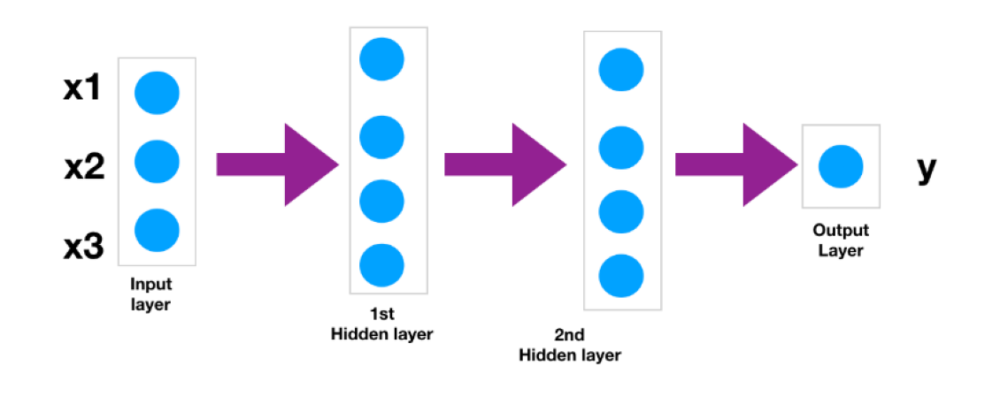

In [88]:
seqimg = imread("/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/helping images/Screenshot from 2022-10-04 01-11-20.png")
funimg = imread("/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/helping images/Screenshot from 2022-10-04 01-11-49.png")
plt.figure(figsize=(20, 10))
ax = plt.subplot()
ax.imshow(seqimg)
plt.axis("off")

(-0.5, 872.5, 494.5, -0.5)

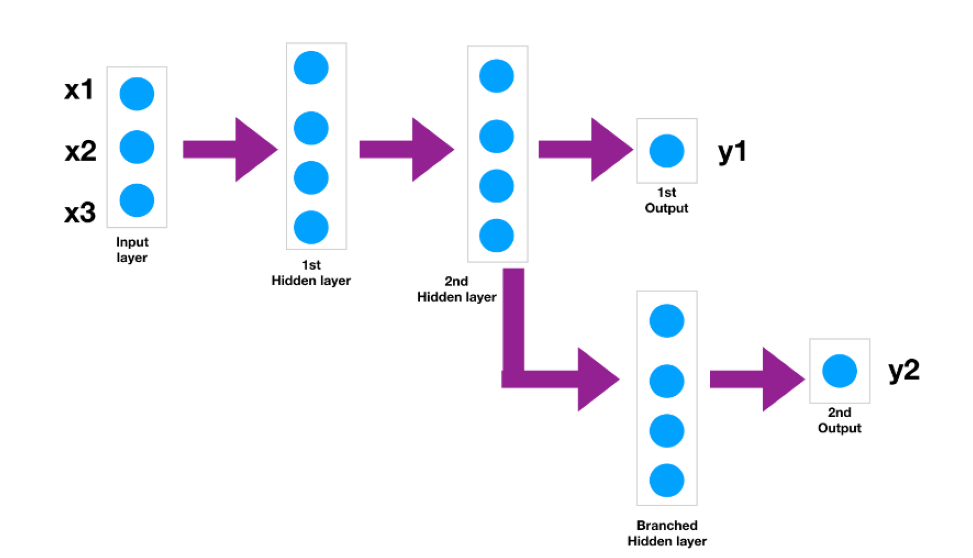

In [82]:
plt.figure(figsize=(20, 10))
ax = plt.subplot()
ax.imshow(funimg)
plt.axis("off")

#Building a sequential model

In [89]:
#Defindnig an input, output shape and the url model that is used as transfer learning.
INPUT_SHAPE = [None, IMAGE_SIZE, IMAGE_SIZE, 3]  #All layers in Keras need to know the shape of their inputs in order to be able to create their weights.
                                                 #This means an image with each pixel with rgb value is passed as an input to the first layer = input layer.

OUTPUT_SHAPE = len(unique_breeds)                #The output of an image is one of the 120 breed labels

INPUT_SHAPE, OUTPUT_SHAPE

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"   #THis is the updated version the course constructor uses version 4 while this is version 5


In [90]:
#
INPUT_SHAPE, OUTPUT_SHAPE

([None, 224, 224, 3], 120)

In [91]:
# creating a function that creates a model
import tensorflow_hub as hub

def create_model(input_shape=INPUT_SHAPE , output_shape=OUTPUT_SHAPE , model_url=MODEL_URL):

  print("building a model using tensorflow hub tranferlearining model ", model_url)

  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), 
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,         #units: Positive integer, dimensionality of the output space.
                          activation="softmax") ])    #activation: Activation function to use. If you don't specify anything, no activation is applied (ie. "linear" activation: a(x) = x).

  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),   #Loss function, to calculate the error produced during modeling
      optimizer=tf.keras.optimizers.Adam(),             #	String (name of optimizer) or optimizer instance.
      metrics=["accuracy"]                              #List of metrics to be evaluated by the model during training and testing
  )

  #When we instantiate a Sequential model without an input shape, it isn't "built": 
  #it has no weights The weights are created when the model first sees some input data:

  model.build(INPUT_SHAPE)
  model.summary()

  return model



In [86]:
#Letme test my function and create a model
model = create_model()

building a model using tensorflow hub tranferlearining model  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_1 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


#Callbacks
  * Callbacks can be passed to keras methods such as `fit`, `evaluate`, and `predict` in order to hook into the various stages of the model training and inference lifecycle.

In [87]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [92]:
#Tensor board callback        TensorBoard is a tool for providing the measurements and visualizations needed during the machine learning workflow

import datetime

def create_tensorboard_callback(fit=False, predict=False):
  if fit==True:
    log_dir = "/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/logs/fits/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    return tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
  elif predict==True:
    log_dir = "/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/logs/predictions/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    return tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)



In [93]:
#Early stoping callbacks        Stop training when a monitored metric has stopped improving.

early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3,               #Number of epochs with no improvement after which training will be stopped.
                                                  verbose=1)               #Verbosity mode, 0 or 1. Mode 0 is silent, and mode 1 displays messages when the callback takes an action



#Training a model
**Note:**
    * Traingin a model on the whole data is not neccesasry at the start since it will take much amount of time, so i will choose 1000 datas to train my model and i will increase it to the full data when i assure all the thing in my model works fine

In [94]:
#determinng number of epoches            #number of complete passes through the training dataset.
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10} 

In [95]:
#making a function that trains our model

def train_model(x):

  tensorboard = create_tensorboard_callback(fit=True)

  model.fit(x,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  return model

In [95]:
#Fitting the model
model = train_model(x=train_data)

Epoch 1/100
25/25 [==============================] - 85s 3s/step - loss: 4.6327 - accuracy: 0.0962 - val_loss: 3.5206 - val_accuracy: 0.2300
Epoch 2/100
25/25 [==============================] - 8s 327ms/step - loss: 1.6599 - accuracy: 0.6600 - val_loss: 2.2536 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 9s 367ms/step - loss: 0.5626 - accuracy: 0.9488 - val_loss: 1.7558 - val_accuracy: 0.5550
Epoch 4/100
25/25 [==============================] - 7s 301ms/step - loss: 0.2490 - accuracy: 0.9912 - val_loss: 1.5702 - val_accuracy: 0.5950
Epoch 5/100
25/25 [==============================] - 7s 300ms/step - loss: 0.1472 - accuracy: 0.9962 - val_loss: 1.4649 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 7s 269ms/step - loss: 0.1001 - accuracy: 1.0000 - val_loss: 1.4243 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================] - 7s 281ms/step - loss: 0.0748 - accuracy: 1.0000 - val_loss: 1.4008 - val_accuracy: 0.6350
E

#Tensorboard Lookup

In [96]:
#Looking our model fitting progress
%tensorboard --logdir /content/drive/MyDrive/Machine\ Learning/Ethio\ Clicks/Dog\ Vision/logs/fits/

Reusing TensorBoard on port 6006 (pid 400), started 0:10:02 ago. (Use '!kill 400' to kill it.)

<IPython.core.display.Javascript object>

#Making prediction on Validation data

In [97]:
#Looking out our prediction
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 8s 167ms/step


array([[1.8421598e-03, 5.6694131e-05, 3.0331194e-04, ..., 1.1692574e-03,
        8.9725814e-05, 2.8037808e-03],
       [2.1056859e-03, 4.9640925e-04, 1.3689291e-02, ..., 5.6508998e-04,
        1.7650686e-02, 9.5649659e-05],
       [3.2773634e-05, 3.9107530e-04, 2.3395638e-04, ..., 4.8186623e-05,
        1.9183195e-04, 1.0292908e-03],
       ...,
       [1.5376980e-05, 2.3931320e-04, 1.3834887e-04, ..., 1.3680488e-04,
        7.2307902e-04, 3.0030429e-04],
       [4.0894253e-03, 6.6488894e-05, 5.0921950e-05, ..., 1.7467560e-04,
        3.8289218e-05, 5.2174143e-03],
       [1.7125717e-04, 7.5016695e-05, 1.2616831e-04, ..., 4.4040843e-03,
        2.5513824e-03, 6.6654829e-05]], dtype=float32)

In [98]:
#looking the first predicion
predictions[0]              #it contains the probablity distribution of each labels

array([1.8421598e-03, 5.6694131e-05, 3.0331194e-04, 1.4078706e-04,
       2.6353993e-03, 2.9231937e-04, 3.4800697e-02, 5.0685252e-04,
       1.7642189e-04, 1.2225559e-03, 1.2950031e-03, 6.2336668e-04,
       8.5737935e-04, 2.5100005e-04, 9.0012798e-04, 2.2064848e-03,
       1.7285021e-04, 1.6204546e-01, 5.1582920e-05, 3.6885944e-04,
       6.7395519e-04, 1.6815780e-04, 5.5988377e-05, 2.1550681e-03,
       2.1006278e-04, 1.1577685e-03, 9.2997707e-02, 5.7703804e-05,
       3.7716277e-04, 8.4094377e-04, 1.2002816e-04, 1.4997871e-03,
       1.4569758e-03, 1.6350705e-04, 1.3155082e-03, 4.0195979e-02,
       1.8620686e-04, 7.4768451e-04, 1.8424066e-04, 7.2724087e-04,
       1.6147927e-03, 5.4186698e-05, 1.2886761e-04, 2.3556224e-04,
       4.2515567e-05, 3.5400240e-04, 1.5257520e-04, 4.1955998e-04,
       1.4285167e-03, 6.0726376e-04, 1.1643263e-03, 1.5823522e-05,
       2.4118132e-04, 1.2021730e-04, 4.3470529e-05, 2.6103409e-05,
       8.5764029e-04, 2.4833726e-03, 1.2068708e-03, 3.5465639e

In [99]:
#looking the labels of the first prediction
unique_breeds[np.argmax(predictions[0])]

'border_terrier'

In [117]:
#creating a function that prints the labels of the predictions
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction):
  return unique_breeds[np.argmax(prediction)]     #returns the hiest prbablity distribution with is the class of the dog


In [101]:
#chexk if our function is working correctly
get_pred_label(predictions[0])

'border_terrier'

#Unbatching the data
**Note:** Splits elements of a dataset into multiple elements on the batch dimension. (deprecated)

In [96]:
#A function that unbatchify the batched data
def unbatchify(data):

  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():         # it iterates to the first the images then the labels sicnce we form slice form these tow
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])                 #it gibves the breed with the highest prbalblity distribution as a class or label
  return images, labels


In [97]:
#checing that the above function works properly and at the same time gettng the images and the labes of our validation data

val_images, val_labels = unbatchify(val_data)


In [104]:
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [98]:
def plot_pred(prediction, labels, images, n):

  pred_label = get_pred_label(predictions[n])             # get the predicted label form the predction using the hihest probablity distribution
  true_label = labels[n]                                  # The true labels or the unpredicted labels of the image
  image = images[n] 


  plt.imshow(image) 
  plt.xticks([])                        #this removes the tickes on both side of the bar
  plt.yticks([])

  if pred_label == true_label:          #this will mark green if the predicion mathces the true labael otherwise it will mark it red
    color = "green"
  else:
    color = "red"
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(prediction[n])*100,
                                    true_label),
                                    color=color)

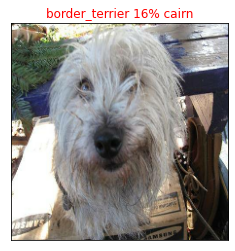

In [106]:
#trying yo plot the prediction on the example data
plot_pred(prediction=predictions,
          labels=val_labels,
          images=val_images,
          n=0)

In [99]:
#The top 10 prediction probabliteis in each prediction
def plot_pred_conf(prediction, labels, n):

  pred_prob = prediction[n]                     #the predction or the predicion probablities
  true_label = labels[n]
  pred_label = get_pred_label(pred_prob)

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]     #a numpy gets the top 10 prediction prbablites  indexes for the giben prediction
  top_10_pred_values = pred_prob[top_10_pred_indexes]       #Get the top ten prediction prabalities 
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]   #then convert the values to their corresponding labes or breed naems

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="tomato")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")


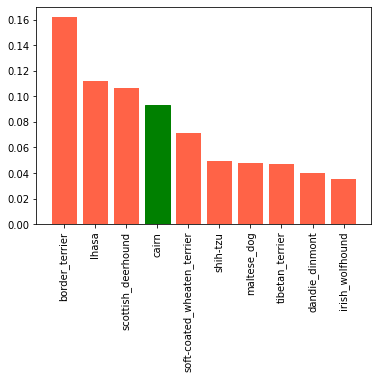

In [108]:
#checking out the function and tries to plot the top 10 dog breed calss guess for the predicted dog
plot_pred_conf(prediction=predictions,
               labels=val_labels,
               n=0)

#Plotting the top 10 guesses for the dog and along with the actual prediction comparsion

In [100]:
#making a functin that draws the top ten breedtion guess for the image
def plot_top10_guesses(num_rows, num_cols, i_multiplier):
    num_images = num_rows*num_cols
    plt.figure(figsize=(10*num_cols, 5*num_rows))
    for i in range(num_images):
        plt.subplot(num_rows, 2*num_cols, 2*i+1)
        plot_pred(prediction=predictions,
                    labels=val_labels,
                    images=val_images,
                    n=i+i_multiplier)
        plt.subplot(num_rows, 2*num_cols, 2*i+2)
        plot_pred_conf(prediction=predictions,
                        labels=val_labels,
                        n=i+i_multiplier)
    plt.tight_layout(h_pad=1.0)
    plt.show()

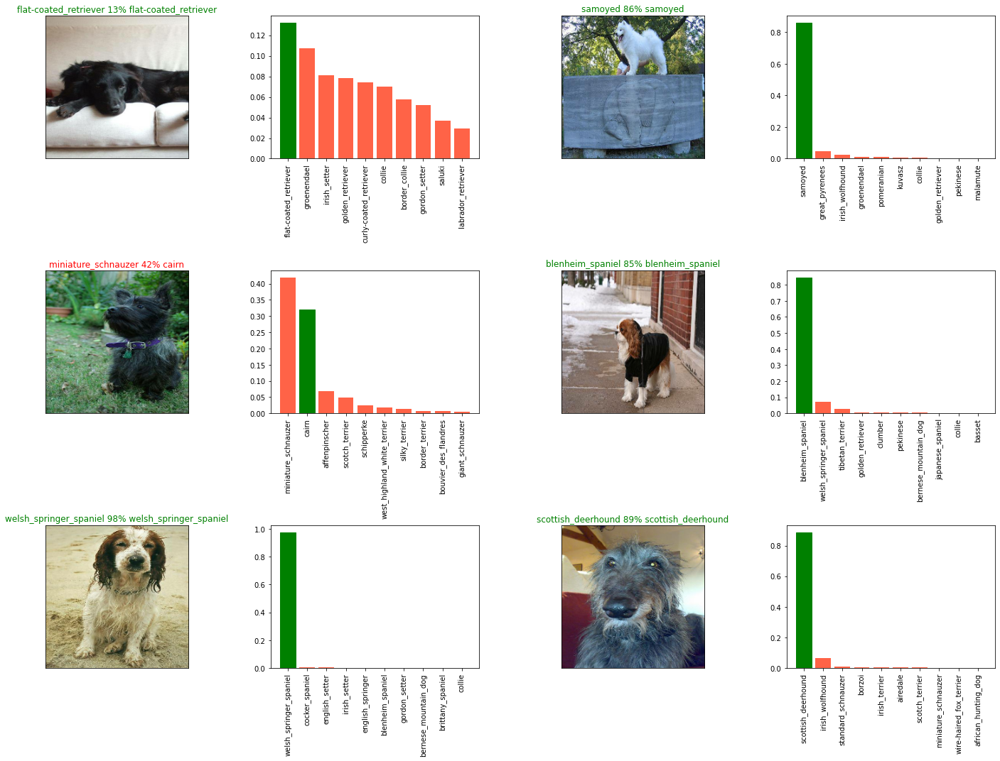

In [110]:
plot_top10_guesses(num_rows=3, num_cols=2, i_multiplier=20)

#Saving and Reloading a model
*  Model progress can be saved during and after training. This means a model can resume where it left off and avoid long training times.
*  And i prefer to use **tf.keras.Model.save** to save a model's **architecture**, **weights**, and t**raining configuration** in a single **file/folder**. 

In [101]:
#Saving a model
def save_model(model):
  modeldir = "/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/models/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
  model_path = modeldir + "-" + "dog-breed-classifiction-mobilnetv2-model.h5"                      # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [102]:
# Create a function to load a trained model
def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})    #this a recommendation loading since we used transfer learning form tnsorflow hub
  return model

In [116]:
#letw check if our save and load functions work properly using the small model bulilt
save_model(model)

Saving model to: /content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/models/20221005-045051-dog-breed-classifiction-mobilnetv2-model.h5...


'/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/models/20221005-045051-dog-breed-classifiction-mobilnetv2-model.h5'

In [103]:
loaded_model = load_model("/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/models/20221005-045051-dog-breed-classifiction-mobilnetv2-model.h5")

Loading saved model from: /content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/models/20221005-045051-dog-breed-classifiction-mobilnetv2-model.h5


#Train with the whole data

In [104]:
#Checking our training data
len(X), len(Y)

(10222, 10222)

In [105]:
# Create a data batch with the full data set
full_data = create_data_batches(X, Y)

Creating training data batches...


In [106]:
# Create a model for full model
full_model = create_model()

building a model using tensorflow hub tranferlearining model  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [107]:
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [130]:
# Fit the full model to the full data

full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[create_tensorboard_callback(fit=True), full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 49s 142ms/step - loss: 1.3281 - accuracy: 0.6719
Epoch 2/100
320/320 [==============================] - 43s 133ms/step - loss: 0.3993 - accuracy: 0.8807
Epoch 3/100
320/320 [==============================] - 45s 140ms/step - loss: 0.2384 - accuracy: 0.9345
Epoch 4/100
320/320 [==============================] - 43s 136ms/step - loss: 0.1537 - accuracy: 0.9630
Epoch 5/100
320/320 [==============================] - 44s 138ms/step - loss: 0.1060 - accuracy: 0.9781
Epoch 6/100
320/320 [==============================] - 46s 145ms/step - loss: 0.0758 - accuracy: 0.9874
Epoch 7/100
320/320 [==============================] - 46s 142ms/step - loss: 0.0591 - accuracy: 0.9904
Epoch 8/100
320/320 [==============================] - 47s 147ms/step - loss: 0.0465 - accuracy: 0.9940
Epoch 9/100
320/320 [==============================] - 46s 143ms/step - loss: 0.0371 - accuracy: 0.9968
Epoch 10/100
320/320 [==============================] - 42s 131m

In [131]:
#Saving the model
save_model(full_model)

Saving model to: /content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/models/20221005-065635-dog-breed-classifiction-mobilnetv2-model.h5...


'/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/models/20221005-065635-dog-breed-classifiction-mobilnetv2-model.h5'

In [108]:
# Load in the full model
loaded_full_model = load_model('/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/models/20221005-065635-dog-breed-classifiction-mobilnetv2-model.h5')

Loading saved model from: /content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/models/20221005-065635-dog-breed-classifiction-mobilnetv2-model.h5


#Prediction on the test data


In [109]:
# Load test image filenames
import os
test_path = "/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/test/dffba3aed600801a5f91c5034bec5b08.jpg',
 '/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/test/df01edf92d38b334f78bd85460304801.jpg',
 '/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/test/df0196ea5d16d1570c1f2b567b975b90.jpg',
 '/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/test/e2b4d6b6590fa2941e74238248093eb3.jpg',
 '/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/test/e6926a5046cd957245918c33985bcd62.jpg',
 '/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/test/ddf0164ab3a269b179051bdecaea34b0.jpg',
 '/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/test/e1d31decdd6521df89e59d181f0c73ed.jpg',
 '/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/test/e5c313a35ac162b3b88b50157f6fd309.jpg',
 '/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/test/e421e13d0d4c977ab89fa9965221809c.jpg',
 '/content

In [110]:
# Create test data batch
import tensorflow as tf
test_data = create_data_batches(test_filenames, test_data=True)


Creating test data batches...


In [16]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 1231s 4s/step


In [21]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [111]:
test_predictions[:2]

array([[2.10610948e-13, 4.03741112e-08, 7.80962794e-12, 2.28192736e-08,
        7.79032291e-07, 2.04378847e-10, 9.80694692e-12, 1.93247127e-10,
        2.96154865e-13, 8.09913117e-13, 4.26402455e-11, 2.72696674e-11,
        3.76982223e-10, 3.08477063e-11, 8.28876736e-08, 5.97650374e-10,
        5.54222557e-10, 5.03346209e-09, 3.01523495e-09, 1.39702958e-10,
        1.30710134e-07, 4.01857396e-04, 1.94052796e-09, 5.91906428e-07,
        2.27785564e-13, 5.41391375e-04, 1.15614263e-11, 2.89772425e-11,
        5.93864424e-09, 1.11527259e-12, 5.09176035e-11, 4.23248459e-09,
        1.74456005e-11, 4.14468015e-09, 4.37857889e-10, 2.08241857e-13,
        1.55557983e-10, 3.56850549e-08, 1.15774992e-06, 6.33277708e-10,
        4.74628947e-10, 1.59105146e-10, 2.31313024e-10, 1.51006941e-12,
        7.37987622e-12, 7.25224394e-11, 2.36162698e-08, 1.18618601e-07,
        3.19829958e-08, 2.01317167e-08, 5.06923337e-10, 9.19844568e-01,
        1.13541523e-10, 1.24997501e-09, 2.49992166e-10, 2.982011

In [139]:
test_filenames[0], test_filenames[1], unique_breeds[np.argmax(test_predictions[0])],  unique_breeds[np.argmax(test_predictions[1])]

('/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/test/dffba3aed600801a5f91c5034bec5b08.jpg',
 '/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/test/df01edf92d38b334f78bd85460304801.jpg',
 'great_dane',
 'standard_poodle')

In [113]:
len(test_predictions), len(test_filenames)

(10357, 10357)

In [ ]:
test_filenames[0], test_filenames[1], unique_breeds[np.argmax(test_predictions[0])],  unique_breeds[np.argmax(test_predictions[1])]

('/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/test/dffba3aed600801a5f91c5034bec5b08.jpg',
 '/content/drive/MyDrive/Machine Learning/Ethio Clicks/Dog Vision/test/df01edf92d38b334f78bd85460304801.jpg',
 'great_dane',
 'standard_poodle')

Text(0.5, 1.0, 'great_dane')

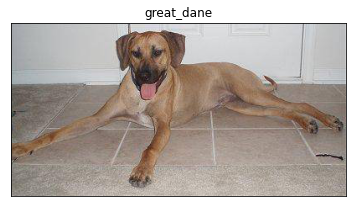

In [183]:
#seeing the image of the dog with preddicted class
  img = plt.imread(test_filenames[0])
  plt.imshow(img)
  plt.xticks([])                        #this removes the tickes on both side of the bar
  plt.yticks([])
  plt.title(unique_breeds[np.argmax(test_predictions[0])])

# 10*num_cols, 5*num_rows

#  plt.subplot(num_rows, 2*num_cols, 2*i+1)

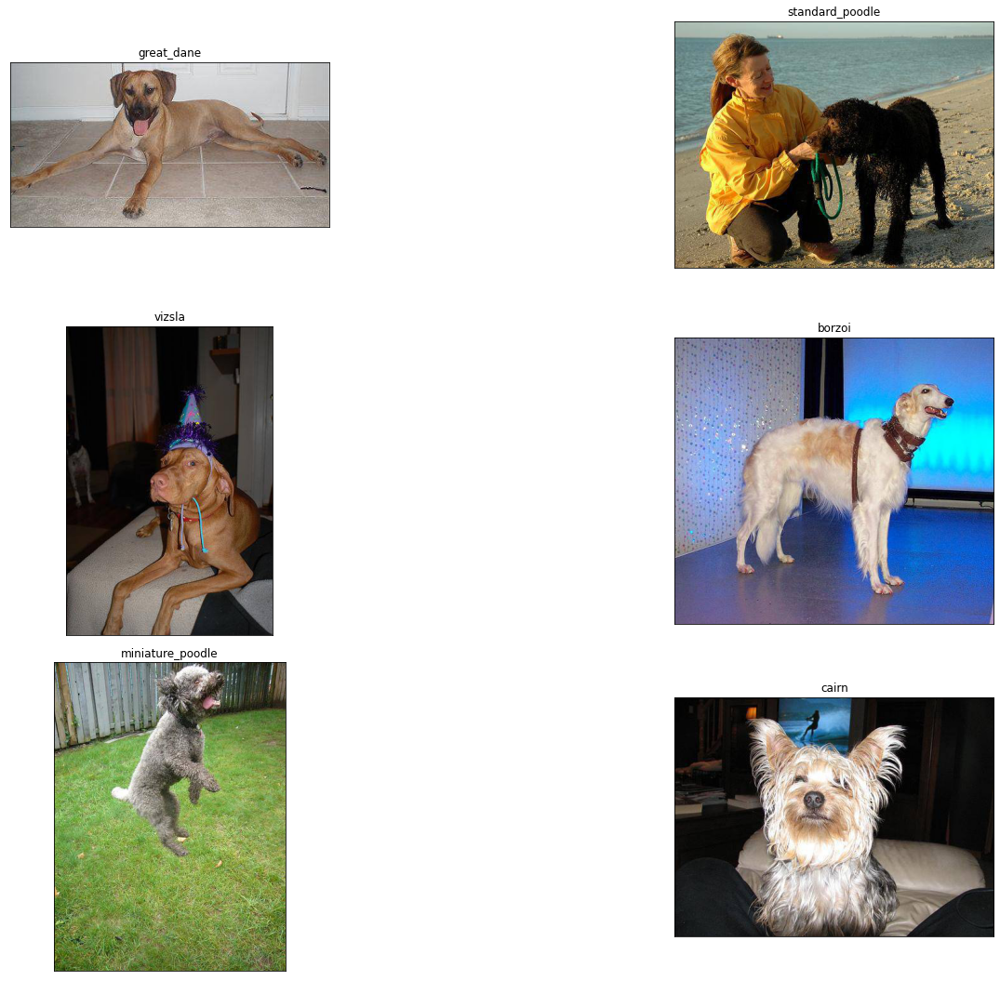

In [182]:
#Making a lots of them
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  img = plt.imread(test_filenames[i])
  plt.imshow(img)
  plt.xticks([])                        #this removes the tickes on both side of the bar
  plt.yticks([])
  plt.title(unique_breeds[np.argmax(test_predictions[i])])
plt.tight_layout(h_pad=1.0)
plt.show()